In [ ]:
# The file will be located in the main folder

In [1]:
cd ..

/Users/armandoroqueestrada/Library/Mobile Documents/com~apple~CloudDocs/GitHub/Euskera


In [2]:
import multiprocessing
import numpy as np
import euskera as eu

import matplotlib.pyplot as plt

In [3]:
### Referential Profiles
# n = 0
En0 = 2.4538867992147075  # energy eingevalue
Mn0 = 5.491059312232425/np.sqrt(2)
temp = np.load('./Soliton Profile Files/initial_f_n0.npz')
fn0 = temp['arr_0']

# n = 1
En1 = 2.2967598868951598
Mn1 = 12.212985738200105/np.sqrt(2)
temp = np.load('./Soliton Profile Files/initial_f_n1.npz')
fn1 = temp['arr_0']

In [9]:
rn

(array([0.000000e+00, 1.000000e-05, 2.000000e-05, ..., 9.738907e+01,
        9.738908e+01, 9.738909e+01]),)

(0.0, 20.0)

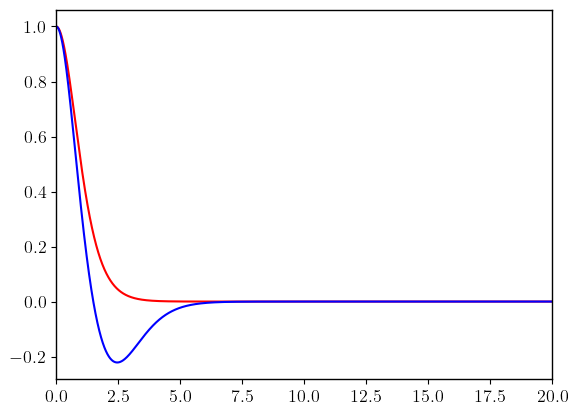

In [11]:
# Uncomment if you want to plot the profiles.
delta_r = 0.00001
rn = np.arange(len(fn0))*delta_r
plt.plot(rn, fn0, 'red')

rn = np.arange(len(fn1))*delta_r
plt.plot(rn, fn1, 'blue')

plt.xlim(0, 20)


In [4]:
#### identifying the cpu_processing number
num_threads = multiprocessing.cpu_count()  


#### Symulation Parameters
simulation_parameters = {
"lambda_value": 0,  # Self-interaction coupling constant.
"num_threads": num_threads,  # Set the number of threads to use.
"gridlength": 20,  # Length of the grid in codec units.
"resol": 128,  # Grid resolution. The grid is computed using:
               # linspace(-gridlength/2.0 + gridlength/(2.0*resol), 
               #           gridlength/2.0 - gridlength/(2.0*resol), resol).
"step_factor": 1.,  # Increase this if velocities are low enough that the timestep constraint can be relaxed.
"t0": 0,  # Initial time.
"tmax": 100,  # Total simulation time.
"Plim": 5.6,  # Boundary radius of the soliton.
"rmax": 7.6,  # Two rmax define the minimum separation between solitons 
              # to ensure they are not overlapping.
"cmass": 0,  # Central mass, given in the same units as the soliton mass.
"plott0": False,  # Show the initial profile if True.
"Boverlap": False,  # Check for possible overlap if True.
"info": False  # Print extra information if True.
}

#### Save data information/parameters
salva_data = {
  "format": "npz",  # Format used to save data. Supported formats: "npz" and "hdf5".
  "address": "Data",  # Directory where the data will be saved.
  "save_number": 20,  # Number of frames to save within the time interval [t0, tmax].
  "data_save" : {"grid": True,  # Save grid data.
                 "save_rho": False,   # Save density field (ρ) if True.
                 "save_psi": False,  # Save wavefunction (ψ) if True.
                 "save_phi": True,  # Save potential (φ) if True.
                 "save_plane": True,  # Save plane projections  [:, :, resol/2,]] if True.
                 "save_energies": None,  # Save energy values if specified.
                 "save_line": True}  # Save 1D profile along a specific line [:, resol/2,, resol/2,]]  if True.
}


In [5]:
# Example: Two scalar solitons 

###### Used Model
model = "soliton"

###### Parameters for Components
compfield = 1  # Number of soliton components (for a scalar field: 1, for a vector field: 2, e.g., Ψ = [ψ_x, ψ_y], etc.)

# Component Profiles
sol1 = [fn0]  # If Ψ is a vector (e.g., Ψ = [ψ_x, ψ_y]), specify [fn0, fn0].
sol2 = [fn0]

# Energy Eigenvalues for Each Component
beta1 = [En0]  # If Ψ is a vector, specify [En0, En0].
beta2 = [En0]

###### Configuration Parameters
# Central Positions (x0, y0, z0)
csol1 = [0., 0., 0.]
csol2 = [-4., 0., 0.]

# Velocities
vsol1 = [0., 0., 0.]
vsol2 = [0., 0., 0.]

# Phases
phase1 = [0] 
phase2 = [0]

# Alpha values (only for the non-self-interacting case; otherwise, set to 1)
alpha = lambda massC, mass: (massC / mass) ** 2  # Conversion factor
alpha1 = [alpha(8, Mn0)]
alpha2 = [alpha(3, Mn0)]

# Step size (dr) used to computed the radial profiles previusly
delta_r = 0.00001
dr1 = [delta_r]
dr2 = [delta_r]

In [6]:
parameters_sol = [
    {
        "profiles": sol1,
        "positions": csol1,
        "velocities": vsol1,
        "betas": beta1,
        "phases": phase1,
        "alphas": alpha1,
        "dr": dr1
    },
    {
        "profiles": sol2,
        "positions": csol2,
        "velocities": vsol2,
        "betas": beta2,
        "phases": phase2,
        "alphas": alpha2,
        "dr": dr2
    }
]

# Beginning the simulation
eu.evolve(
    model,
    model_parameters=parameters_sol,
    field_components=compfield,
    salva_data_update=salva_data,
    simulation_parameters_update=simulation_parameters,
    info=False
)

Progress: [####################] 100%
 All data was save


Complete. Total time ->  656.0214529037476
save_frames 21 



In [8]:
## Uncomment in case of load files individually
import os

address = salva_data["address"]
format = salva_data["format"]
save_number = salva_data["save_number"]

# Identifying the file names
filenames = eu.nameData(address, format, info=True)
print(filenames)

Se encontraron 4 archivos con la extensión .npz
['end_save_line.npz', 'end_save_plane.npz', 'end_save_phi.npz', 'end_grid.npz']


In [9]:
# extracting the grid coordinates
temp = np.load(address + f"/{filenames[-1]}")
grid = [temp[cord] for cord in ['x', 'y', 'z']]


# extracting the x-proyection of rho
temp = np.load(address + f"/{filenames[0]}")
lrho = [temp['save_line%s'%num] for num in range(0, save_number+1)]

temp = np.load(address + f"/{filenames[1]}")
planerho = [temp['save_plane%s'%num] for num in range(0, save_number+1)]

temp = np.load(address + f"/{filenames[2]}")
Upot = [temp['save_phi%s'%num] for num in range(0, save_number+1)]

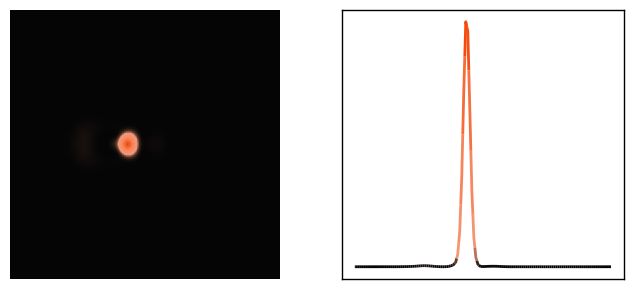

In [10]:
## Illustrative plots from the previusly load data

frame = 10
data = planerho[frame].T
da2 = [grid[0], lrho[frame]]

cmapint = [(0, '#050505'), (0.05, '#f59876'),
           (0.5, '#f57d51'), (0.75, '#f76834'),
           (1, '#f54a0c')]

eu.imagshow2D(data, da2, save=True, xlim=(-1, 1), ylim=(-1, 1), cmapint=cmapint)

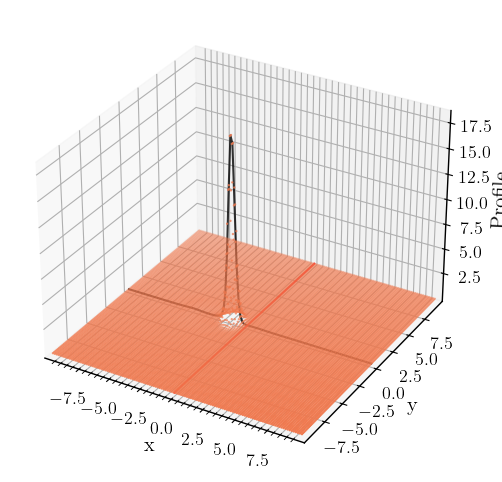

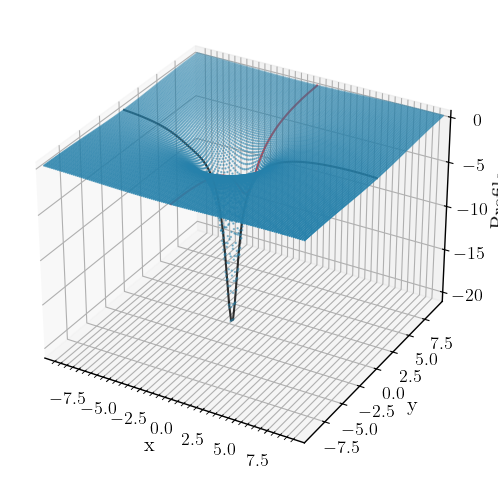

In [12]:
frame = 10
rho = planerho[frame]
phisp = Upot[frame]
xd, yd = grid[0], grid[1]
cxd, cyd = 'x', 'y'
resol = simulation_parameters['resol']

eu.PlaneProf(rho, xd, yd, cxd, cyd, save=False)  # density field
eu.PlaneProf(phisp[:, :, int(resol/2)], xd, yd, cxd, cyd, save=False)  # Potential field

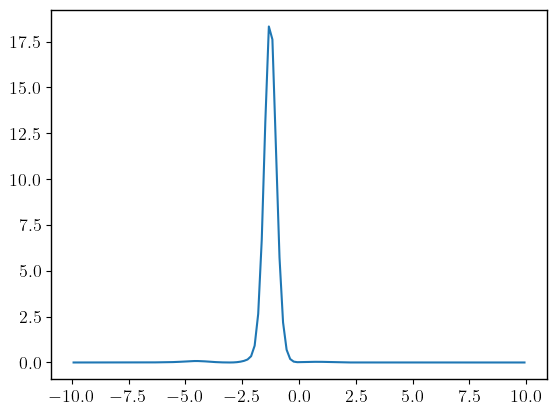

In [13]:
frame = 10
rho = lrho[frame]
xd = grid[0]

plt.plot(xd, rho)

In [ ]:
## Illustrative videos from the save data

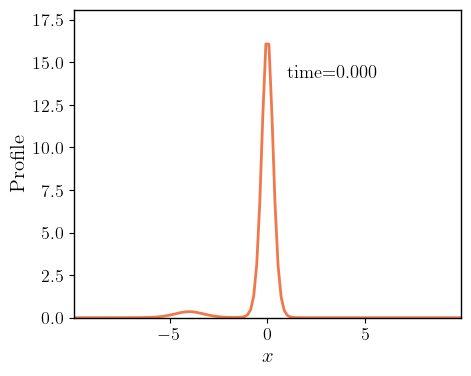

In [16]:
#Example of 2D video

#address = "Data_Est_n0_n0"
figData = plt.subplots(nrows=1, ncols=1, figsize=(5, 4), sharex=False, sharey=False,
                       gridspec_kw=dict(hspace=0.0, wspace=.13))

address = salva_data['address']
dvideo = eu.Visualization(address, figData)  # creando el objeto

n0 = 0  # begin frame
nameP = "save_line"
struc = ['-', 2, '#f0784d']
nameV = 'lin_dens'
coord = ['x']

video = dvideo.video(nameP, struc, nameV, coord=coord, 
                     xlim=None, ylim=None,
                     show=False, n0=n0, plot2D=True, 
                     plot3D=False, save=False)  # in case tha you like to save and not see in the notebook put save to True
display(video)

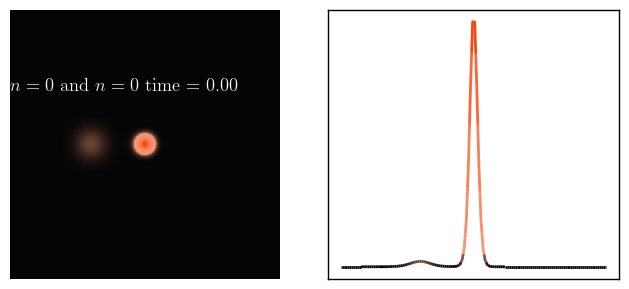

In [18]:
# Example of 2D video

#address = "Data_Est_n0_n0"
figData = plt.subplots(nrows=1, ncols=2, figsize=(8, 3.5), sharex=False, sharey=False,
                       gridspec_kw=dict(hspace=0.0, wspace=.13))

dvideo = eu.Visualization(address, figData)  # creando el objeto

n0 = 0  # begin frame
nameP = "save_line"
name2 = "save_plane"
struc = ['-', 2, '#f0784d']
nameV = 'region_dens2'
coord = ['x']
cmapint=[(0, '#050505'),
         (0.05, '#f59876'),
         (0.5, '#f57d51'),
         (0.75, '#f76834'),
          (1, '#f54a0c')]
vconf = [10, 1000000, ['-vcodec', 'libx264']]

text = r'$n=0$ and $n=0$'

video = dvideo.video(nameP, struc, nameV, name2=name2, cmapint=cmapint,
                     coord=coord, show=True, n0=n0, plot2D=True, plot3D=False,
                     vconf=vconf, save=False,
                     xlim=(-1, 1), ylim=(-1, 1), text=text)
display(video)